In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
from collections import Counter
import folium
from sklearn.cluster import DBSCAN

In [3]:
df=pd.read_csv('Dataset .csv',encoding='unicode_escape')

In [4]:
df.head(50)

,ï»¿Restaurant_ID,Restaurant_Name,Country_Code,City,Address,Locality,Locality_Verbose,Longitude,Latitude,Cuisines,...,Currency,Has_Table_booking,Has_Online_delivery,Is_delivering_now,Switch_to_order_menu,Price_range,Aggregate_rating,Rating_color,Rating_text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229
5,18189371,Din Tai Fung,162,Mandaluyong City,"Ground Floor, Mega Fashion Hall, SM Megamall, ...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056314,14.583764,Chinese,...,Botswana Pula(P),No,No,No,No,3,4.4,Green,Very Good,336
6,6300781,Buffet 101,162,Pasay City,"Building K, SM By The Bay, Sunset Boulevard, M...","SM by the Bay, Mall of Asia Complex, Pasay City","SM by the Bay, Mall of Asia Complex, Pasay Cit...",120.979667,14.531333,"Asian, European",...,Botswana Pula(P),Yes,No,No,No,4,4.0,Green,Very Good,520
7,6301290,Vikings,162,Pasay City,"Building B, By The Bay, Seaside Boulevard, Mal...","SM by the Bay, Mall of Asia Complex, Pasay City","SM by the Bay, Mall of Asia Complex, Pasay Cit...",120.979333,14.540000,"Seafood, Filipino, Asian, European",...,Botswana Pula(P),Yes,No,No,No,4,4.2,Green,Very Good,677
8,6300010,Spiral - Sofitel Philippine Plaza Manila,162,Pasay City,"Plaza Level, Sofitel Philippine Plaza Manila, ...","Sofitel Philippine Plaza Manila, Pasay City","Sofitel Philippine Plaza Manila, Pasay City, P...",120.980090,14.552990,"European, Asian, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.9,Dark Green,Excellent,621
9,6314987,Locavore,162,Pasig City,"Brixton Technology Center, 10 Brixton Street, ...",Kapitolyo,"Kapitolyo, Pasig City",121.056532,14.572041,Filipino,...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,532


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   ï»¿Restaurant_ID      9551 non-null   int64  
 1   Restaurant_Name       9551 non-null   object 
 2   Country_Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality_Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average_Cost_for_two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has_Table_booking     9551 non-null   object 
 13  Has_Online_delivery   9551 non-null   object 
 14  Is_delivering_now     9551 non-null   object 
 15  Switch_to_order_menu 

In [6]:
df.isnull().sum()

ï»¿Restaurant_ID        0
Restaurant_Name         0
Country_Code            0
City                    0
Address                 0
Locality                0
Locality_Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average_Cost_for_two    0
Currency                0
Has_Table_booking       0
Has_Online_delivery     0
Is_delivering_now       0
Switch_to_order_menu    0
Price_range             0
Aggregate_rating        0
Rating_color            0
Rating_text             0
Votes                   0
dtype: int64

In [7]:
df.dropna(inplace=True)

In [8]:
df.isnull().sum()

ï»¿Restaurant_ID        0
Restaurant_Name         0
Country_Code            0
City                    0
Address                 0
Locality                0
Locality_Verbose        0
Longitude               0
Latitude                0
Cuisines                0
Average_Cost_for_two    0
Currency                0
Has_Table_booking       0
Has_Online_delivery     0
Is_delivering_now       0
Switch_to_order_menu    0
Price_range             0
Aggregate_rating        0
Rating_color            0
Rating_text             0
Votes                   0
dtype: int64

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9542 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   ï»¿Restaurant_ID      9542 non-null   int64  
 1   Restaurant_Name       9542 non-null   object 
 2   Country_Code          9542 non-null   int64  
 3   City                  9542 non-null   object 
 4   Address               9542 non-null   object 
 5   Locality              9542 non-null   object 
 6   Locality_Verbose      9542 non-null   object 
 7   Longitude             9542 non-null   float64
 8   Latitude              9542 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average_Cost_for_two  9542 non-null   int64  
 11  Currency              9542 non-null   object 
 12  Has_Table_booking     9542 non-null   object 
 13  Has_Online_delivery   9542 non-null   object 
 14  Is_delivering_now     9542 non-null   object 
 15  Switch_to_order_menu 

In [10]:
df.describe()


,ï»¿Restaurant_ID,Country_Code,Longitude,Latitude,Average_Cost_for_two,Price_range,Aggregate_rating,Votes
count,9.542000e+03,9542.000000,9542.000000,9542.000000,9542.000000,9542.000000,9542.000000,9542.000000
mean,9.043301e+06,18.179208,64.274997,25.848532,1200.326137,1.804968,2.665238,156.772060
std,8.791967e+06,56.451600,41.197602,11.010094,16128.743876,0.905563,1.516588,430.203324
min,5.300000e+01,1.000000,-157.948486,-41.330428,0.000000,1.000000,0.000000,0.000000
25%,3.019312e+05,1.000000,77.081565,28.478658,250.000000,1.000000,2.500000,5.000000
50%,6.002726e+06,1.000000,77.192031,28.570444,400.000000,2.000000,3.200000,31.000000
75%,1.835260e+07,1.000000,77.282043,28.642711,700.000000,2.000000,3.700000,130.000000
max,1.850065e+07,216.000000,174.832089,55.976980,800000.000000,4.000000,4.900000,10934.000000


In [11]:
df.head(20)

,ï»¿Restaurant_ID,Restaurant_Name,Country_Code,City,Address,Locality,Locality_Verbose,Longitude,Latitude,Cuisines,...,Currency,Has_Table_booking,Has_Online_delivery,Is_delivering_now,Switch_to_order_menu,Price_range,Aggregate_rating,Rating_color,Rating_text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229
5,18189371,Din Tai Fung,162,Mandaluyong City,"Ground Floor, Mega Fashion Hall, SM Megamall, ...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056314,14.583764,Chinese,...,Botswana Pula(P),No,No,No,No,3,4.4,Green,Very Good,336
6,6300781,Buffet 101,162,Pasay City,"Building K, SM By The Bay, Sunset Boulevard, M...","SM by the Bay, Mall of Asia Complex, Pasay City","SM by the Bay, Mall of Asia Complex, Pasay Cit...",120.979667,14.531333,"Asian, European",...,Botswana Pula(P),Yes,No,No,No,4,4.0,Green,Very Good,520
7,6301290,Vikings,162,Pasay City,"Building B, By The Bay, Seaside Boulevard, Mal...","SM by the Bay, Mall of Asia Complex, Pasay City","SM by the Bay, Mall of Asia Complex, Pasay Cit...",120.979333,14.540000,"Seafood, Filipino, Asian, European",...,Botswana Pula(P),Yes,No,No,No,4,4.2,Green,Very Good,677
8,6300010,Spiral - Sofitel Philippine Plaza Manila,162,Pasay City,"Plaza Level, Sofitel Philippine Plaza Manila, ...","Sofitel Philippine Plaza Manila, Pasay City","Sofitel Philippine Plaza Manila, Pasay City, P...",120.980090,14.552990,"European, Asian, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.9,Dark Green,Excellent,621
9,6314987,Locavore,162,Pasig City,"Brixton Technology Center, 10 Brixton Street, ...",Kapitolyo,"Kapitolyo, Pasig City",121.056532,14.572041,Filipino,...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,532


# level 1

# Determine the top three most common cuisines in the dataset

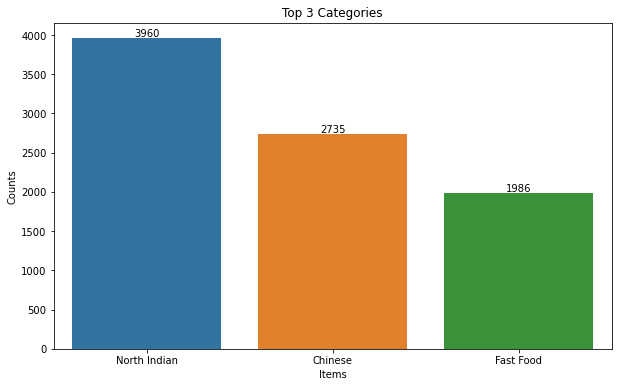

In [12]:
split_cuisines= df['Cuisines'].str.split(', ').explode('Cuisines')
counts = Counter(split_cuisines)
top_3 = counts.most_common(3)

categories = [item[0] for item in top_3]
counts = [item[1] for item in top_3]

plt.figure(figsize=(10, 6))
ax=sns.barplot(x=categories, y=counts)

ax.bar_label(ax.containers[0])
plt.xlabel('Items')
plt.ylabel('Counts')
plt.title('Top 3 Categories')
plt.show()


# Calculate the percentage of restaurants that serve each of the top cuisines.


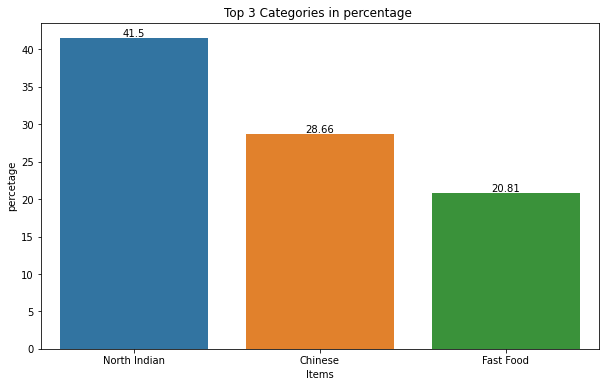

In [14]:
data=split_cuisines
counts = Counter(data)

top_3 = counts.most_common(3)
top_3_categories = [item[0] for item in top_3]
top_3_counts = [item[1] for item in top_3]

top_3_cuisines=pd.Series(top_3_counts)

unique_count = len(set(df['ï»¿Restaurant_ID']))
percentage_top_3 = (top_3_cuisines / unique_count) * 100

percentage_top_3=round(percentage_top_3,2)
plt.figure(figsize=(10, 6))

ax=sns.barplot(x=top_3_categories, y=percentage_top_3)
ax.bar_label(ax.containers[0])

plt.xlabel('Items')
plt.ylabel('percetage')
plt.title('Top 3 Categories in percentage ')
plt.show()

#  Identify the city with the highest number of restaurants in the dataset.

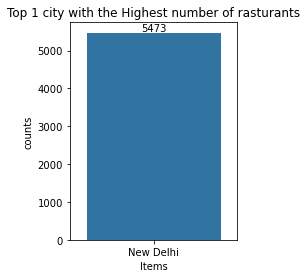

In [15]:
data=df['City']
counts = Counter(data)

top_3 = counts.most_common(1)
categories = [item[0] for item in top_3]
counts = [item[1] for item in top_3]
plt.figure(figsize=(3,4))
ax=sns.barplot(x=categories, y=counts)
ax.bar_label(ax.containers[0])

plt.xlabel('Items')
plt.ylabel('counts')
plt.title('Top 1 city with the Highest number of rasturants')
plt.show()

# Calculate the average rating for restaurants in each city.

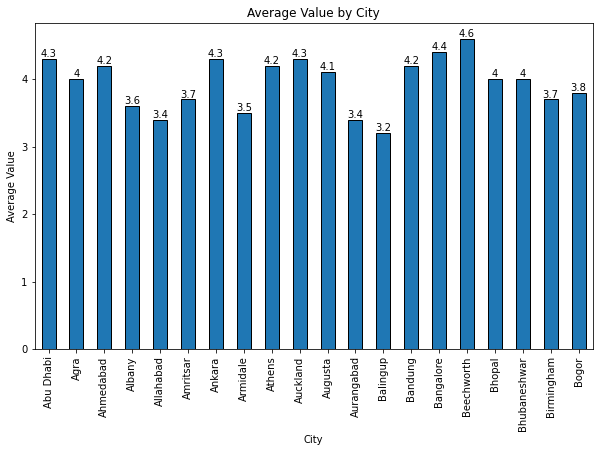

In [16]:
city_averages = df.groupby('City')['Aggregate_rating'].mean().round(1).head(20)

plt.figure(figsize=(10, 6))
ax=city_averages.plot(kind='bar', edgecolor='black')
ax.bar_label(ax.containers[0])
plt.xlabel('City')
plt.ylabel('Average Value')
plt.title('Average Value by City')
plt.show()

# Determine the city with the highest average rating

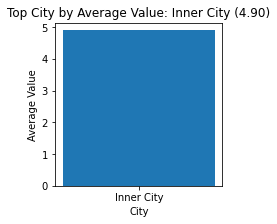

In [17]:
city_averages = df.groupby('City')['Aggregate_rating'].mean()

top_city = city_averages.idxmax()
top_average = city_averages.max()

plt.figure(figsize=(3,3))
plt.bar(top_city, top_average)

plt.xlabel('City')
plt.ylabel('Average Value')
plt.title(f'Top City by Average Value: {top_city} ({top_average:.2f})')
plt.show()

# Create a histogram or bar chart to visualize the distribution of price ranges among the restaurants

# Histogram plot

<Figure size 720x432 with 0 Axes>

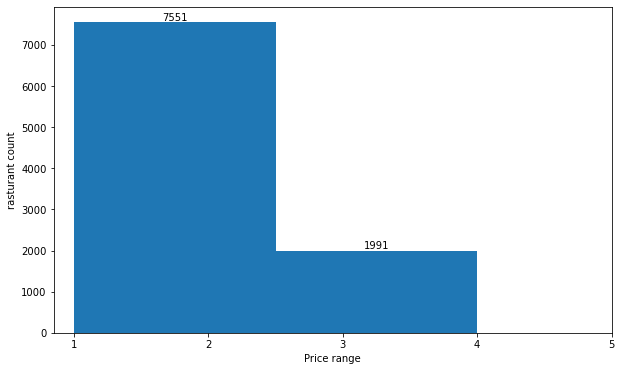

In [18]:
ranges=df['Price_range']
plt.figure(figsize=(10, 6))
fig, ax = plt.subplots(figsize=(10, 6))
n,bins,patchs =plt.hist(ranges,bins=2)
ax.bar_label(patchs)
plt.xticks([1,2,3,4,5])
plt.xlabel('Price range')
plt.ylabel('rasturant count')
plt.show()

# bar_plot

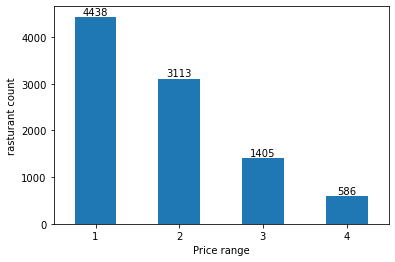

In [19]:
price_distribution = df['Price_range'].value_counts()
ax=price_distribution.plot(kind='bar')
ax.bar_label(ax.containers[0])
plt.xticks(rotation=0)
plt.xlabel('Price range')
plt.ylabel('rasturant count')
plt.show()

# Calculate the percentage of restaurants in each price range category

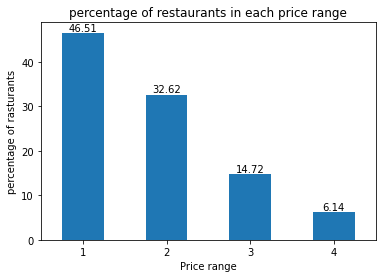

In [20]:
price_distribution = df['Price_range'].value_counts()
resturant=len(df['Restaurant_Name'] )
percentage=(price_distribution/resturant)*100
percentage=percentage.round(2)
ax=percentage.plot(kind='bar')
ax.bar_label(ax.containers[0])
plt.xticks(rotation=0)
plt.title('percentage of restaurants in each price range')
plt.xlabel('Price range')
plt.ylabel('percentage of rasturants')
plt.show()

# Determine the percentage of restaurants that offer online delivery.

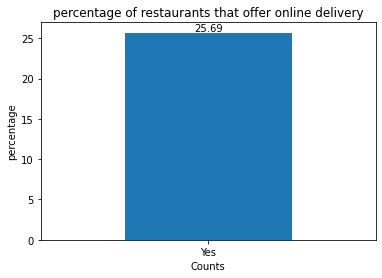

In [21]:
delivery= (df['Has_Online_delivery'] == 'Yes').sum()
resturant=len(df['Restaurant_Name'] )
percentage=(delivery/resturant)*100
percentage=percentage.round(2)
percentage=pd.Series(percentage)
ax=percentage.plot(kind='bar')
ax.bar_label(ax.containers[0])
plt.title('percentage of restaurants that offer online delivery')
plt.xlabel('Counts')
plt.ylabel('percentage')
plt.xticks(ticks=[0], labels=['Yes'],rotation=0)
plt.show()

# Compare the average ratings of restaurants with and without online delivery

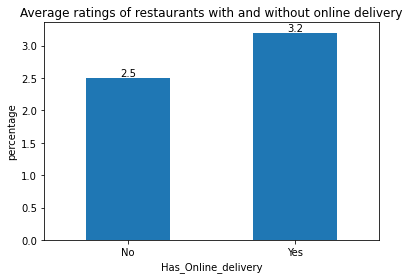

In [22]:
average=df.groupby('Has_Online_delivery')['Aggregate_rating'].mean().round(1)
ax=average.plot(kind='bar')
ax.bar_label(ax.containers[0])
plt.xticks(rotation=0)
plt.title('Average ratings of restaurants with and without online delivery')
plt.ylabel('percentage')
plt.xlabel('Has_Online_delivery')
plt.show()

# Level 2

# Analyze the distribution of aggregate ratings and determine the most common rating range

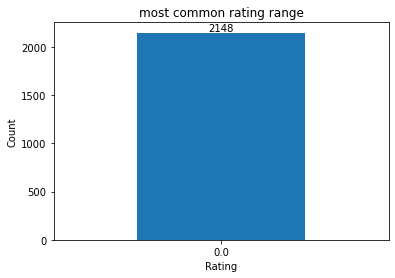

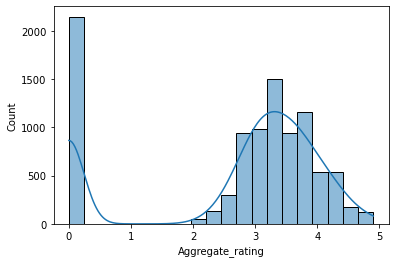

In [23]:
data=df['Aggregate_rating'].value_counts().head(1)
ax=data.plot(kind='bar')
ax.bar_label(ax.containers[0])
plt.title('most common rating range')
plt.xticks(rotation=0)
plt.xlabel('Rating')
plt.ylabel('Count')
plt.show()

sns.histplot(df["Aggregate_rating"],kde=True,bins=20)
plt.show()

# Calculate the average number of votes received by restaurants

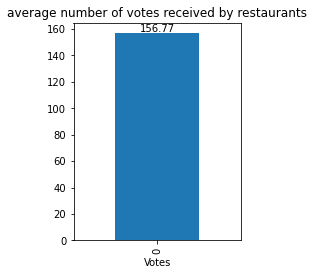

In [24]:
average=(df['Votes'].sum())/len(df)
average=average.round(2)
average=pd.Series(average)
plt.figure(figsize=(3,4))
ax=average.plot(kind='bar')
ax.bar_label(ax.containers[0])
plt.xlabel('Votes')
plt.title('average number of votes received by restaurants')
plt.show()

# Identify the most common combinations of cuisines in the dataset.

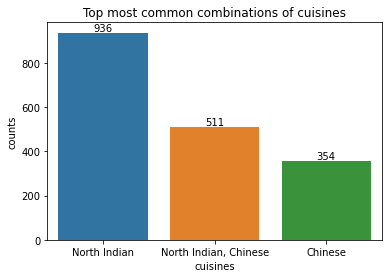

In [25]:
data=df['Cuisines']
counts = Counter(data)
top_1 = counts.most_common(3)
categories = [item[0] for item in top_1]
counts = [item[1] for item in top_1]
ax=sns.barplot(x=categories,y=counts)
ax.bar_label(ax.containers[0])
plt.xlabel('cuisines')
plt.ylabel('counts')
plt.title('Top most common combinations of cuisines')
plt.show()

# Determine if certain cuisine combinations tend to have higher ratings

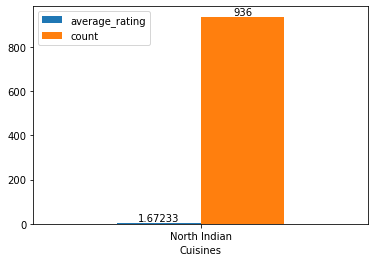

In [26]:
cuisine_stats = df.groupby('Cuisines').agg(
    average_rating=('Aggregate_rating', 'mean'),
    count=('Cuisines', 'count')
).sort_values(by='count', ascending=False).head(1)
ax=cuisine_stats.plot(kind='bar')
ax.bar_label(ax.containers[0])
ax.bar_label(ax.containers[1])
plt.xticks(rotation=0)
plt.show()

# Plot the locations of restaurants on a map using longitude and latitude coordinates.

In [13]:
map_center = [df["Latitude"].mean(), df["Longitude"].mean()]
mymap = folium.Map(location=map_center, zoom_start=5)
location=df[['Restaurant_Name','Latitude','Longitude']].values.tolist()
fg=folium.FeatureGroup(name='Rasturant Location')

for i in location:
    fg.add_child(folium.Marker(location=[i[1],i[2]],popup=i[0],icon=folium.Icon(color="green")))
mymap.add_child(fg)

# Identify any patterns or clusters of restaurants in specific areas

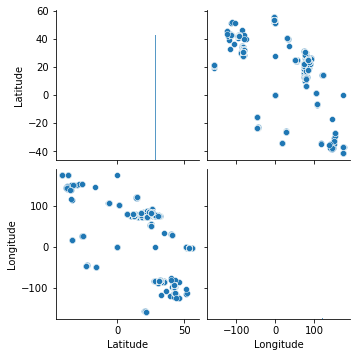

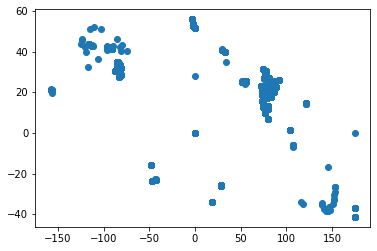

In [106]:
loc=df[['Latitude', 'Longitude']]
sns.pairplot(data=loc)
plt.show()
plt.scatter(df['Longitude'], df['Latitude'])
plt.show()

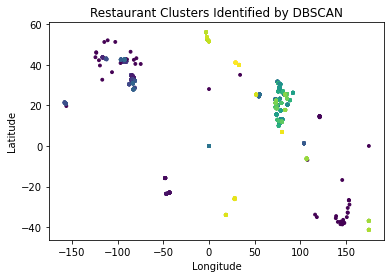

In [109]:
loc=df[['Latitude', 'Longitude']]
dbs = DBSCAN(eps=0.5, min_samples=5)
df['Predict'] = dbs.fit_predict(loc)
plt.scatter(df['Longitude'], df['Latitude'], c=df['Predict'], s=8)
plt.title('Restaurant Clusters Identified by DBSCAN')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

# Identify if there are any restaurant chains present in the dataset.

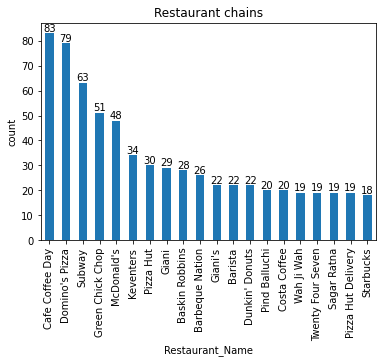

In [112]:
restaurant_counts = df['Restaurant_Name'].value_counts()
top = restaurant_counts[restaurant_counts > 1].head(20)
ax=top.plot(kind='bar')
ax.bar_label(ax.containers[0])
plt.ylabel('count')
plt.xlabel('Restaurant_Name')
plt.title('Restaurant chains')
plt.show()

#  Analyze the ratings and popularity of different restaurant chains

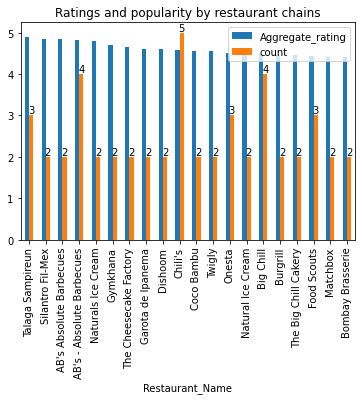

In [113]:
top_rat=df.groupby('Restaurant_Name').agg(Aggregate_rating=('Aggregate_rating', 'mean'),
    count=('Restaurant_Name','count')).sort_values(by='Aggregate_rating', ascending=False)
top_rat = top_rat[top_rat['count'] > 1]
top_rat = top_rat.sort_values(by='Aggregate_rating', ascending=False).head(20)
ax=top_rat.plot(kind='bar')
ax.bar_label(ax.containers[1])
plt.title('Ratings and popularity by restaurant chains')
plt.show()

# Level 3

# Analyze the text reviews to identify the most common positive and negative keywords

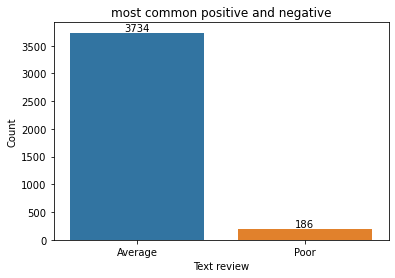

In [68]:
data=df['Rating_text']
count=Counter(data)
positive=count.most_common(1)
negative=count.most_common()[-1:-2:-1]
pos_cat=[item[0] for item in positive]
pos_count=[item[1] for item  in positive]

neg_cat=[item[0] for item in negative]
neg_count=[item[1] for item in negative]

all_labels = list(pos_cat) + list(neg_cat)
all_counts = list(pos_count) + list(neg_count)
ax=sns.barplot(x=all_labels,y=all_counts)
ax.bar_label(ax.containers[0])
plt.title('most common positive and negative')
plt.ylabel('Count')
plt.xlabel('Text review')
plt.show()

# Calculate the average length of reviews and explore if there is a relationship between review length and rating

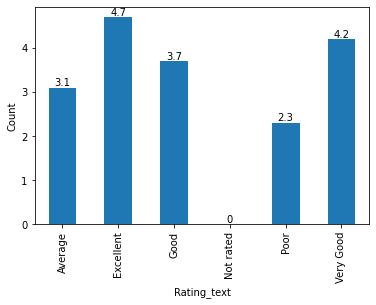

In [85]:
relation=df.groupby('Rating_text')['Aggregate_rating'].mean().round(1)
ax=relation.plot(kind='bar')
ax.bar_label(ax.containers[0])
plt.ylabel('Count')
plt.show()

#  Identify the restaurants with the highest and lowest number of votes

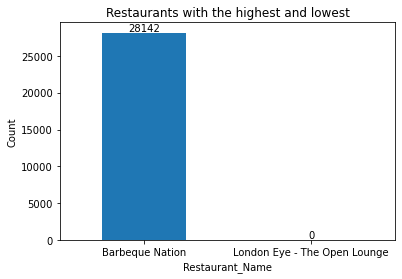

In [49]:
df['Restaurant_Name']=df['Restaurant_Name']
highest=df.groupby('Restaurant_Name')['Votes'].sum().sort_values(ascending=False).head(1)
lowest=df.groupby('Restaurant_Name')['Votes'].sum().sort_values(ascending=True).head(1)
combined = pd.concat([highest, lowest])
ax=combined.plot(kind='bar')
ax.bar_label(ax.containers[0])
plt.title('Restaurants with the highest and lowest')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.show()

# Analyze if there is a correlation between the number of votes and the rating of a restaurant.


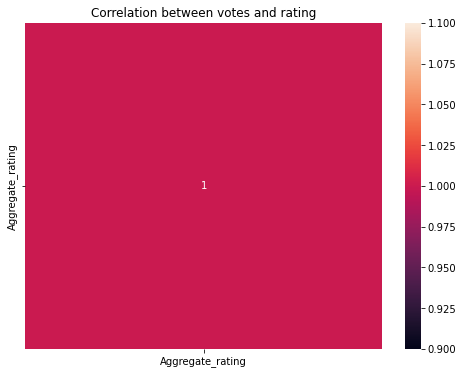

In [117]:
x=df['Aggregate_rating']
y=df['Votes']
d1=pd.DataFrame(x,y)
co=d1.corr()
plt.figure(figsize=(8, 6))
sns.heatmap(co, annot=True)
plt.title('Correlation between votes and rating')
plt.show()

# Analyze if there is a relationship between the price range and the availability of online delivery and table booking

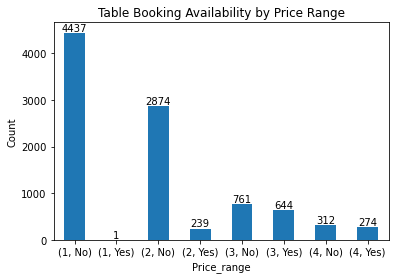

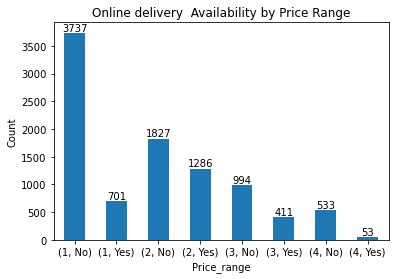

In [116]:
table_book=df.groupby('Price_range')['Has_Table_booking'].value_counts()
ax=table_book.plot(kind='bar')
ax.bar_label(ax.containers[0])
plt.xticks(rotation=0)
plt.title('Table Booking Availability by Price Range')
plt.ylabel('Count')
plt.xlabel('Price_range')
plt.show()
online=df.groupby('Price_range')['Has_Online_delivery'].value_counts()
ax=online.plot(kind='bar')
ax.bar_label(ax.containers[0])
plt.title('Online delivery  Availability by Price Range')
plt.xlabel('Price_range')
plt.xticks(rotation=0)
plt.ylabel('Count')
plt.show()

# Determine if higher-priced restaurants are more likely to offer these services

In [118]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9542 entries, 0 to 9550
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   ï»¿Restaurant_ID      9542 non-null   int64  
 1   Restaurant_Name       9542 non-null   object 
 2   Country_Code          9542 non-null   int64  
 3   City                  9542 non-null   object 
 4   Address               9542 non-null   object 
 5   Locality              9542 non-null   object 
 6   Locality_Verbose      9542 non-null   object 
 7   Longitude             9542 non-null   float64
 8   Latitude              9542 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average_Cost_for_two  9542 non-null   int64  
 11  Currency              9542 non-null   object 
 12  Has_Table_booking     9542 non-null   object 
 13  Has_Online_delivery   9542 non-null   object 
 14  Is_delivering_now     9542 non-null   object 
 15  Switch_to_order_menu 

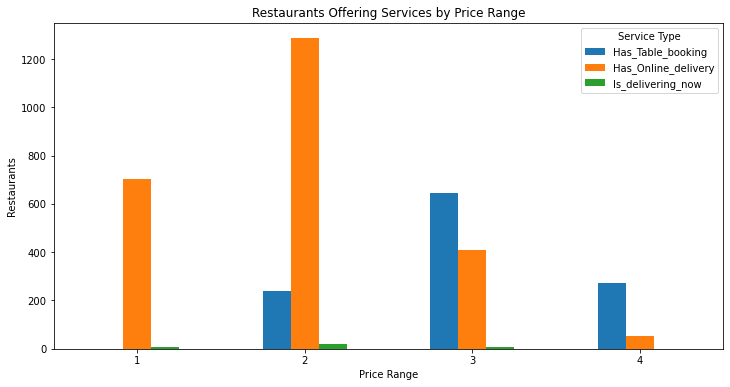

In [55]:
df[["Has_Table_booking", "Has_Online_delivery", "Is_delivering_now"]] = df[
    ["Has_Table_booking", "Has_Online_delivery", "Is_delivering_now"]
].apply(lambda x: x.map({"Yes": 1, "No": 0}))

service = df.groupby("Price_range").agg(
    Has_Table_booking=("Has_Table_booking", "sum"),
    Has_Online_delivery=("Has_Online_delivery", "sum"),
    Is_delivering_now=("Is_delivering_now", "sum"),
)

service.plot(kind="bar",figsize=(12,6))

plt.title("Restaurants Offering Services by Price Range")
plt.xlabel("Price Range")
plt.ylabel("Restaurants")
plt.xticks(rotation=0)
plt.legend(title="Service Type")

plt.show()